In [66]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import holidays
from datetime import datetime
from workalendar.europe import UnitedKingdom
from meteostat import Point, Daily
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error

In [67]:
# import holidays
for holiday in holidays.UnitedKingdom(years=[2009, 2010]).items():
    print(holiday)

(datetime.date(2009, 1, 1), "New Year's Day")
(datetime.date(2009, 1, 2), 'New Year Holiday [Scotland]')
(datetime.date(2009, 3, 17), "St. Patrick's Day [Northern Ireland]")
(datetime.date(2009, 7, 12), 'Battle of the Boyne [Northern Ireland]')
(datetime.date(2009, 8, 3), 'Summer Bank Holiday [Scotland]')
(datetime.date(2009, 11, 30), "St. Andrew's Day [Scotland]")
(datetime.date(2009, 12, 25), 'Christmas Day')
(datetime.date(2009, 4, 10), 'Good Friday')
(datetime.date(2009, 4, 13), 'Easter Monday [England/Wales/Northern Ireland]')
(datetime.date(2009, 5, 4), 'May Day')
(datetime.date(2009, 5, 25), 'Spring Bank Holiday')
(datetime.date(2009, 8, 31), 'Late Summer Bank Holiday [England/Wales/Northern Ireland]')
(datetime.date(2009, 12, 26), 'Boxing Day')
(datetime.date(2009, 12, 28), 'Boxing Day (Observed)')
(datetime.date(2010, 1, 1), "New Year's Day")
(datetime.date(2010, 1, 2), 'New Year Holiday [Scotland]')
(datetime.date(2010, 1, 4), 'New Year Holiday [Scotland] (Observed)')
(dateti

In [68]:
# add holidays to dataframe
de_holidays = holidays.UnitedKingdom(years=[2009, 2011])
range_of_dates = pd.date_range("2009-12-01", "2011-12-31")
df_holiday = pd.DataFrame(
    data={"date": range_of_dates, "is_holiday": [date in de_holidays for date in range_of_dates]}
)
df_holiday.index = df_holiday['date']
df_holiday = df_holiday.drop(columns=['date'])
df_holiday["is_holiday"] = df_holiday["is_holiday"].astype(int)
df_holiday.head()

,is_holiday
date,
2009-12-01,0
2009-12-02,0
2009-12-03,0
2009-12-04,0
2009-12-05,0


In [69]:
sales = pd.read_pickle('../Data/sales_day_filtered.pkl')
sales['date'] = pd.to_datetime(sales['date'])
sales['weekday'] = sales['date'].dt.dayofweek
sales['month'] = sales['date'].dt.month
sales['quarter'] = sales['date'].dt.quarter
sales['day'] = sales['date'].dt.day
sales.index = pd.Series(sales['date'])
sales.head(10)

,date,total_amount,weekday,month,quarter,day
date,,,,,,
2009-12-01,2009-12-01,37366.32,1,12,4,1
2009-12-02,2009-12-02,36596.16,2,12,4,2
2009-12-03,2009-12-03,20965.15,3,12,4,3
2009-12-04,2009-12-04,31448.44,4,12,4,4
2009-12-05,2009-12-05,9042.36,5,12,4,5
2009-12-06,2009-12-06,23171.03,6,12,4,6
2009-12-07,2009-12-07,28474.07,0,12,4,7
2009-12-08,2009-12-08,32750.78,1,12,4,8
2009-12-09,2009-12-09,28832.94,2,12,4,9


In [70]:
sales_holiday = sales.join(df_holiday, how='left')
sales_holiday.head()

,date,total_amount,weekday,month,quarter,day,is_holiday
date,,,,,,,
2009-12-01,2009-12-01,37366.32,1,12,4,1,0
2009-12-02,2009-12-02,36596.16,2,12,4,2,0
2009-12-03,2009-12-03,20965.15,3,12,4,3,0
2009-12-04,2009-12-04,31448.44,4,12,4,4,0
2009-12-05,2009-12-05,9042.36,5,12,4,5,0


In [71]:
range_of_dates = pd.date_range("2009-12-01", "2011-12-31")
start = datetime(2009, 12, 1)
end = datetime(2011, 12, 31)
# london_location = Point(51.5072, 0.1276)
df_weather = Daily('03772', start, end) #weather station code of Heathrow Airport
df_weather = df_weather.fetch()
df_weather['prcp'] = df_weather['prcp'].fillna(method='ffill')
df_weather['wspd'] = df_weather['wspd'].fillna(method='ffill')
df_weather['pres'] = df_weather['pres'].fillna(method='ffill')
df_weather = df_weather[['tavg','prcp', 'wspd', 'pres']]
df_weather.head(5)

,tavg,prcp,wspd,pres
time,,,,
2009-12-01,3.4,9.9,9.7,1011.2
2009-12-02,8.4,0.5,13.9,1011.2
2009-12-03,6.5,13.7,17.9,997.7
2009-12-04,4.6,0.5,14.9,1006.8
2009-12-05,9.9,3.3,18.8,999.3


In [72]:
sales_holiday_weather = sales_holiday.join(df_weather, how='left')
sales_holiday_weather.head()

,date,total_amount,weekday,month,quarter,day,is_holiday,tavg,prcp,wspd,pres
date,,,,,,,,,,,
2009-12-01,2009-12-01,37366.32,1,12,4,1,0,3.4,9.9,9.7,1011.2
2009-12-02,2009-12-02,36596.16,2,12,4,2,0,8.4,0.5,13.9,1011.2
2009-12-03,2009-12-03,20965.15,3,12,4,3,0,6.5,13.7,17.9,997.7
2009-12-04,2009-12-04,31448.44,4,12,4,4,0,4.6,0.5,14.9,1006.8
2009-12-05,2009-12-05,9042.36,5,12,4,5,0,9.9,3.3,18.8,999.3


### OLS

In [73]:
sales_holiday_weather = sales_holiday_weather.reset_index(drop=True)
X = sales_holiday_weather.loc[:,['weekday', 'month', 'is_holiday', 'tavg']].values
y = sales_holiday_weather.loc[:,'total_amount'].values
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
predictions = model.predict(X)

print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.318
Model:                            OLS   Adj. R-squared:                  0.313
Method:                 Least Squares   F-statistic:                     69.73
Date:                Fri, 03 Mar 2023   Prob (F-statistic):           1.82e-48
Time:                        16:44:20   Log-Likelihood:                -6265.0
No. Observations:                 604   AIC:                         1.254e+04
Df Residuals:                     599   BIC:                         1.256e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        1.74e+04    947.557     18.366      0.0

In [74]:
X = sales_holiday_weather.loc[:,['weekday', 'month', 'is_holiday', 'tavg']].values.tolist()
y = sales_holiday_weather.total_amount.values.tolist()
X = sm.add_constant(X)

X_train = X[0:int(len(X)*0.8)]
X_test_1 = X[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
X_test_2 = X[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
X_test_3 = X[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

y_train = y[0:int(len(X)*0.8)]
Y_test = y[int(len(X)*0.8):]
Y_test_1 = y[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
Y_test_2 = y[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
Y_test_3 = y[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

OLS_results = sm.OLS(y_train,X_train).fit()

#In sample predictions
in_sample_predictions_poisson = OLS_results.predict(X_train) 

#Out of sample predictions
out_sample_predictions_OLS_1 = OLS_results.predict(X_test_1)
out_sample_predictions_OLS_2 = OLS_results.predict(X_test_2)
out_sample_predictions_OLS_3 = OLS_results.predict(X_test_3)
out_sample_predictions_OLS = np.concatenate((out_sample_predictions_OLS_1, 
                                                    out_sample_predictions_OLS_2,
                                                    out_sample_predictions_OLS_3), axis = 0)

OLS_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.300
Model:                            OLS   Adj. R-squared:                  0.294
Method:                 Least Squares   F-statistic:                     51.10
Date:                Fri, 03 Mar 2023   Prob (F-statistic):           8.07e-36
Time:                        16:44:20   Log-Likelihood:                -5017.2
No. Observations:                 483   AIC:                         1.004e+04
Df Residuals:                     478   BIC:                         1.007e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.724e+04   1015.302     16.977      0.000    1.52e+04    1.92e+04
x1          -931.5245    185.537     -5.021      0.000   -1296.093    -566.956
x2          1389.8571    106.860     13.006      0.000    1179.883    1599.831
x3         -2913.4469   2834.083     -1.028      0.304   -8482.248    2655.354
x4          -287.2828     59.947     -4.792      0.000    -405.076    -169.490
==============================================================================
Omnibus:                       97.537   Durbin-Watson:                   1.094
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              751.576
Skew:                           0.629   Prob(JB):                    6.27e-164
Kurtosis:                       8.980   Cond. No.                         107.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [75]:
# Train test split with 80/20 with last 20% data as the test when order is needed
X_train = X[0:int(len(X)*0.8)]; X_test = X[int(len(X)*0.8):]
y_train = y[0:int(len(X)*0.8)]; Y_test = y[int(len(X)*0.8):]

model = sm.OLS(y_train,X_train).fit()

#In sample predictions
in_sample_predictions = model.predict(X_train) 

#Out of sample predictions
out_sample_predictions = model.predict(X_test)

fig = plt.figure(figsize=(150,70))
ax = plt.subplot()
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],y_train,'k',linewidth=8)
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],in_sample_predictions,'b',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],Y_test,'k--',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],out_sample_predictions,'b--',linewidth=8)
ax.set_xlabel('Time');ax.set_ylabel('Total Sales'); 
ax.legend(['training','in sample predictions','test','out sample predictions'],fontsize=100)
plt.show()

MAP1: 0.44920836965500827
MAP2: 0.2705429458164349
MAP3: 0.2691266357547967


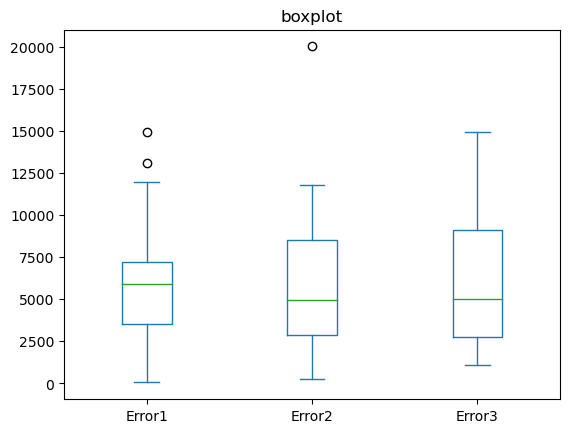

In [76]:
print('MAP1:', mean_absolute_percentage_error(Y_test_1, out_sample_predictions_OLS_1))
print('MAP2:', mean_absolute_percentage_error(Y_test_2, out_sample_predictions_OLS_2))
print('MAP3:', mean_absolute_percentage_error(Y_test_3, out_sample_predictions_OLS_3))

error1 = abs(Y_test_1-out_sample_predictions_OLS_1)
error2 = abs(Y_test_2-out_sample_predictions_OLS_2)
error3 = abs(Y_test_3-out_sample_predictions_OLS_3)

data = pd.DataFrame({"Error1": error1, "Error2": error2, "Error3": error3[:-1]})

# Plot the dataframe
ax = data[['Error1', 'Error2', 'Error3']].plot(kind='box', title='boxplot')

# Display the plot
plt.show()

In [77]:
print(mean_absolute_percentage_error(Y_test, out_sample_predictions))

0.32912598913061475


### Poisson

In [92]:
sales_holiday_weather.head()

,date,total_amount,weekday,month,quarter,day,is_holiday,tavg,prcp,wspd,pres
0,2009-12-01,37366.32,1,12,4,1,0,3.4,9.9,9.7,1011.2
1,2009-12-02,36596.16,2,12,4,2,0,8.4,0.5,13.9,1011.2
2,2009-12-03,20965.15,3,12,4,3,0,6.5,13.7,17.9,997.7
3,2009-12-04,31448.44,4,12,4,4,0,4.6,0.5,14.9,1006.8
4,2009-12-05,9042.36,5,12,4,5,0,9.9,3.3,18.8,999.3


In [93]:
X = sales_holiday_weather.loc[:,['weekday', 'month', 'day', 'is_holiday', 'tavg', 'prcp']].values.tolist()
y = sales_holiday_weather.total_amount.values.tolist()
X = sm.add_constant(X)

X_train = X[0:int(len(X)*0.8)]
X_test_1 = X[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
X_test_2 = X[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
X_test_3 = X[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

y_train = y[0:int(len(X)*0.8)]
Y_test = y[int(len(X)*0.8):]
Y_test_1 = y[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
Y_test_2 = y[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
Y_test_3 = y[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

poisson_results = sm.GLM(y_train, X_train, family=sm.families.Poisson()).fit()

#In sample predictions
in_sample_predictions_poisson = poisson_results.predict(X_train) 

#Out of sample predictions
out_sample_predictions_poisson_1 = poisson_results.predict(X_test_1)
out_sample_predictions_poisson_2 = poisson_results.predict(X_test_2)
out_sample_predictions_poisson_3 = poisson_results.predict(X_test_3)
out_sample_predictions_poisson = np.concatenate((out_sample_predictions_poisson_1, 
                                                    out_sample_predictions_poisson_2,
                                                    out_sample_predictions_poisson_3), axis = 0)

poisson_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                  483
Model:                            GLM   Df Residuals:                      476
Model Family:                 Poisson   Df Model:                            6
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -6.6922e+05
Date:                Fri, 03 Mar 2023   Deviance:                   1.3328e+06
Time:                        17:13:41   Pearson chi2:                 1.28e+06
No. Iterations:                     5   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.7444      0.001   8445.290      0.000       9.742       9.747
x1            -0.0481      0.000   -282.859      0.000      -0.048      -0.048
x2             0.0638    9.1e-05    700.556      0.000       0.064       0.064
x3            -0.0006   3.86e-05    -16.502      0.000      -0.001      -0.001
x4            -0.1493      0.003    -55.750      0.000      -0.155      -0.144
x5            -0.0105   5.19e-05   -201.522      0.000      -0.011      -0.010
x6            -0.0018   9.73e-05    -18.873      0.000      -0.002      -0.002
==============================================================================
"""

In [94]:
fig = plt.figure(figsize=(150,70))
ax = plt.subplot()
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],y_train,'k',linewidth=8)
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],in_sample_predictions_poisson,'b',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],Y_test,'k--',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],out_sample_predictions_poisson,'b--',linewidth=8)
ax.set_xlabel('Time');ax.set_ylabel('Total Sales'); 
ax.legend(['training','in sample predictions','test','out sample predictions'],fontsize=100)
plt.show()


MAP1: 0.43457055957432783
MAP2: 0.26475841526798777
MAP3: 0.2744730478954471


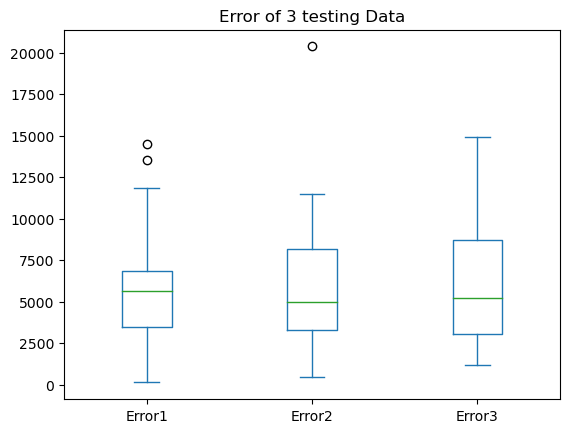

In [95]:
print('MAP1:', mean_absolute_percentage_error(Y_test_1, out_sample_predictions_poisson_1))
print('MAP2:', mean_absolute_percentage_error(Y_test_2, out_sample_predictions_poisson_2))
print('MAP3:', mean_absolute_percentage_error(Y_test_3, out_sample_predictions_poisson_3))

error1 = abs(Y_test_1-out_sample_predictions_poisson_1)
error2 = abs(Y_test_2-out_sample_predictions_poisson_2)
error3 = abs(Y_test_3-out_sample_predictions_poisson_3)

data = pd.DataFrame({"Error1": error1, "Error2": error2, "Error3": error3[:-1]})

# Plot the dataframe
ax = data[['Error1', 'Error2', 'Error3']].plot(kind='box', title='Error of 3 testing Data')

# Display the plot
plt.show()

In [82]:
print(mean_absolute_percentage_error(Y_test, out_sample_predictions_poisson))

0.324186396342198


### Gamma

In [83]:
X = sales_holiday_weather.loc[:,['weekday', 'month', 'tavg', 'prcp']].values.tolist()
y = sales_holiday_weather.total_amount.values.tolist()
X = sm.add_constant(X)

X_train = X[0:int(len(X)*0.8)]
X_test_1 = X[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
X_test_2 = X[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
X_test_3 = X[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

y_train = y[0:int(len(X)*0.8)]
Y_test = y[int(len(X)*0.8):]
Y_test_1 = y[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
Y_test_2 = y[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
Y_test_3 = y[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

Gamma_results = sm.GLM(y_train, X_train, family=sm.families.Gamma()).fit()

#In sample predictions
in_sample_predictions_gamma = Gamma_results.predict(X_train) 

#Out of sample predictions
out_sample_predictions_gamma_1 = Gamma_results.predict(X_test_1)
out_sample_predictions_gamma_2 = Gamma_results.predict(X_test_2)
out_sample_predictions_gamma_3 = Gamma_results.predict(X_test_3)
out_sample_predictions_gamma = np.concatenate((out_sample_predictions_gamma_1, 
                                                    out_sample_predictions_gamma_2,
                                                    out_sample_predictions_gamma_3), axis = 0)

Gamma_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                  483
Model:                            GLM   Df Residuals:                      478
Model Family:                   Gamma   Df Model:                            4
Link Function:          inverse_power   Scale:                         0.12733
Method:                          IRLS   Log-Likelihood:                -4963.4
Date:                Fri, 03 Mar 2023   Deviance:                       72.230
Time:                        16:45:17   Pearson chi2:                     60.9
No. Iterations:                     7   Pseudo R-squ. (CS):             0.3690
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       6.095e-05   2.59e-06     23.527      0.000    5.59e-05     6.6e-05
x1           2.29e-06   4.24e-07      5.407      0.000    1.46e-06    3.12e-06
x2         -2.981e-06   2.23e-07    -13.367      0.000   -3.42e-06   -2.54e-06
x3          3.345e-07   1.25e-07      2.673      0.008    8.93e-08     5.8e-07
x4          8.547e-08   2.44e-07      0.351      0.726   -3.92e-07    5.63e-07
==============================================================================
"""

In [84]:
fig = plt.figure(figsize=(150,70))
ax = plt.subplot()
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],y_train,'k',linewidth=8)
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],in_sample_predictions_gamma,'b',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],Y_test,'k--',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],out_sample_predictions_gamma,'b--',linewidth=8)
ax.set_xlabel('Time');ax.set_ylabel('Total Sales'); 
ax.legend(['training','in sample predictions','test','out sample predictions'],fontsize=100)
plt.show()


MAP1: 0.43510864121408604
MAP2: 0.2576900782226262
MAP3: 0.27437385647215745


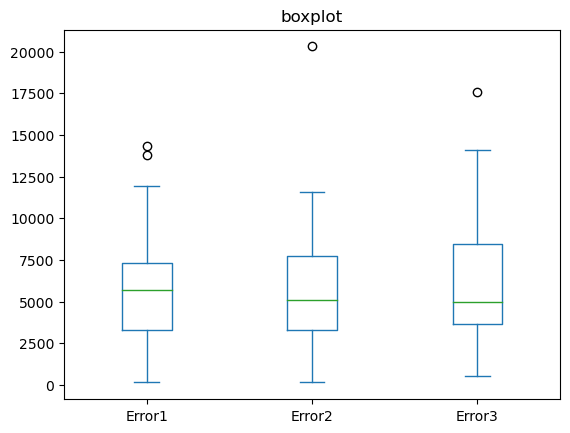

In [85]:
print('MAP1:', mean_absolute_percentage_error(Y_test_1, out_sample_predictions_gamma_1))
print('MAP2:', mean_absolute_percentage_error(Y_test_2, out_sample_predictions_gamma_2))
print('MAP3:', mean_absolute_percentage_error(Y_test_3, out_sample_predictions_gamma_3))

error1 = abs(Y_test_1-out_sample_predictions_gamma_1)
error2 = abs(Y_test_2-out_sample_predictions_gamma_2)
error3 = abs(Y_test_3-out_sample_predictions_gamma_3)

data = pd.DataFrame({"Error1": error1, "Error2": error2, "Error3": error3[:-1]})

# Plot the dataframe
ax = data[['Error1', 'Error2', 'Error3']].plot(kind='box', title='boxplot')

# Display the plot
plt.show()

In [86]:
print(mean_absolute_percentage_error(Y_test, out_sample_predictions))

0.32912598913061475


### Gaussian

In [87]:
X = sales_holiday_weather.loc[:,['weekday', 'month', 'tavg']].values.tolist()
y = sales_holiday_weather.total_amount.values.tolist()
X = sm.add_constant(X)

X_train = X[0:int(len(X)*0.8)]
X_test_1 = X[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
X_test_2 = X[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
X_test_3 = X[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

y_train = y[0:int(len(X)*0.8)]
Y_test = y[int(len(X)*0.8):]
Y_test_1 = y[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
Y_test_2 = y[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
Y_test_3 = y[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

Gaussian_results = sm.GLM(y_train, X_train, family=sm.families.Gaussian()).fit()

#In sample predictions
in_sample_predictions_gaussian = Gaussian_results.predict(X_train) 

#Out of sample predictions
out_sample_predictions_gaussian_1 = Gaussian_results.predict(X_test_1)
out_sample_predictions_gaussian_2 = Gaussian_results.predict(X_test_2)
out_sample_predictions_gaussian_3 = Gaussian_results.predict(X_test_3)
out_sample_predictions_gaussian = np.concatenate((out_sample_predictions_gaussian_1, 
                                                    out_sample_predictions_gaussian_2,
                                                    out_sample_predictions_gaussian_3), axis = 0)

Gaussian_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                  483
Model:                            GLM   Df Residuals:                      479
Model Family:                Gaussian   Df Model:                            3
Link Function:               identity   Scale:                      6.2332e+07
Method:                          IRLS   Log-Likelihood:                -5017.8
Date:                Fri, 03 Mar 2023   Deviance:                   2.9857e+10
Time:                        16:45:30   Pearson chi2:                 2.99e+10
No. Iterations:                     3   Pseudo R-squ. (CS):             0.3436
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        1.71e+04   1006.752     16.986      0.000    1.51e+04    1.91e+04
x1          -910.5248    184.420     -4.937      0.000   -1271.981    -549.069
x2          1392.3439    106.839     13.032      0.000    1182.943    1601.745
x3          -285.6745     59.931     -4.767      0.000    -403.136    -168.213
==============================================================================
"""

In [88]:
fig = plt.figure(figsize=(150,70))
ax = plt.subplot()
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],y_train,'k',linewidth=8)
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],in_sample_predictions,'b',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],Y_test,'k--',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],out_sample_predictions,'b--',linewidth=8)
ax.set_xlabel('Time');ax.set_ylabel('Total Sales'); 
ax.legend(['training','in sample predictions','test','out sample predictions'],fontsize=100)
plt.show()

MAP1: 0.4522319262542555
MAP2: 0.27061480150230854
MAP3: 0.2670765311033473


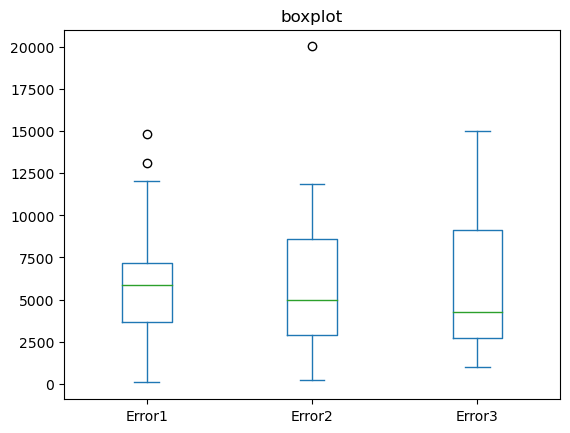

In [89]:
print('MAP1:', mean_absolute_percentage_error(Y_test_1, out_sample_predictions_gaussian_1))
print('MAP2:', mean_absolute_percentage_error(Y_test_2, out_sample_predictions_gaussian_2))
print('MAP3:', mean_absolute_percentage_error(Y_test_3, out_sample_predictions_gaussian_3))

error1 = abs(Y_test_1-out_sample_predictions_gaussian_1)
error2 = abs(Y_test_2-out_sample_predictions_gaussian_2)
error3 = abs(Y_test_3-out_sample_predictions_gaussian_3)

data = pd.DataFrame({"Error1": error1, "Error2": error2, "Error3": error3[:-1]})

# Plot the dataframe
ax = data[['Error1', 'Error2', 'Error3']].plot(kind='box', title='boxplot')

# Display the plot
plt.show()

In [90]:
print(mean_absolute_percentage_error(Y_test, out_sample_predictions))

0.32912598913061475
